In [2]:
import numpy as np 
import pandas as pd 
import statistics

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib 
plt.style.use("ggplot")
import plotly.express as px
from matplotlib import rcParams
rcParams['figure.figsize'] = 14, 7
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

In [4]:
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier

## Optimización de hiperparámetros
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
import multiprocessing
from multiprocessing import Pool
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold

In [5]:
## Métricas de evaluación
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer

In [66]:
df_ros = pd.read_csv('../input/ictus-evaluation/ros.csv')
df_ros

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.793173,0.946674,0.886546,0.977693,10.281081,0.058824,0.050420,0.044118,0.495020,0.495020
1,LogisticRegression,0.770080,0.777851,0.770080,0.777983,1.026228,0.843137,0.273016,0.162879,0.804637,0.804637
2,DecissionTree,0.921687,0.799367,0.732932,0.806230,10.000723,0.666667,0.203593,0.120141,0.701587,0.701587
3,KNN,0.861446,0.965945,0.916667,1.000000,9.090909,0.078431,0.087912,0.100000,0.520168,0.520168
4,GradientBoosting,0.824297,0.994456,0.943775,1.000000,5.957447,0.019608,0.034483,0.142857,0.506629,0.506629
5,RandomForest,0.941767,0.990496,0.941767,1.000000,6.183369,0.039216,0.064516,0.181818,0.514846,0.514846
6,AdaBoost,0.770080,0.813622,0.765060,0.817582,6.865028,0.803922,0.259494,0.154717,0.783442,0.783442
7,XGB,0.931727,0.980201,0.925703,1.000000,8.026030,0.019608,0.026316,0.040000,0.497106,0.497106
8,CatBoost,0.919679,0.908263,0.857430,0.940074,9.638597,0.509804,0.268041,0.181818,0.692997,0.692997
9,LGBM,0.915663,0.839364,0.772088,0.848469,9.892714,0.705882,0.240803,0.145161,0.740772,0.740772


In [67]:
df_rus = pd.read_csv('../input/ictus-evaluation/rus.csv')
df_rus

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.658635,0.794872,0.734940,0.817949,11.294662,0.862745,0.250000,0.146179,0.795394,0.795394
1,LogisticRegression,0.730924,0.779487,0.738956,0.800000,8.260870,0.862745,0.252874,0.148148,0.797510,0.797510
2,DecissionTree,0.683735,0.782051,0.695783,0.792308,13.872794,0.882353,0.229008,0.131579,0.784034,0.784034
3,KNN,0.687751,0.684615,0.610442,0.715385,17.191296,0.647059,0.145374,0.081886,0.627762,0.627762
4,GradientBoosting,0.726908,0.794872,0.696787,0.802564,15.180669,0.862745,0.225641,0.129794,0.775288,0.775288
5,RandomForest,0.725904,0.776923,0.705823,1.000000,41.678521,0.803922,0.218667,0.126543,0.752225,0.752225
6,AdaBoost,0.712851,0.784615,0.695783,0.792308,13.872794,0.882353,0.229008,0.131579,0.784034,0.784034
7,XGB,0.709839,0.797436,0.708835,0.802564,13.222924,0.882353,0.236842,0.136778,0.790912,0.790912
8,CatBoost,0.717871,0.792308,0.679719,0.800000,17.695716,0.882353,0.220049,0.125698,0.775568,0.775568
9,LGBM,0.708835,0.746154,0.709839,0.792308,11.617887,0.882353,0.237467,0.137195,0.791441,0.791441


In [68]:
df_smote = pd.read_csv('../input/ictus-evaluation/sm.csv')
df_smote

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.859438,0.917987,0.900602,0.969472,7.647052,0.078431,0.074766,0.071429,0.511702,0.511702
1,LogisticRegression,0.831325,0.776073,0.832329,0.779043,6.402083,0.725490,0.307054,0.194737,0.781793,0.781793
2,DecissionTree,0.875502,0.800330,0.830321,0.821122,1.107905,0.686275,0.292887,0.186170,0.762185,0.762185
3,KNN,0.852410,0.915677,0.885542,1.000000,12.925170,0.078431,0.065574,0.056338,0.503766,0.503766
4,GradientBoosting,0.899598,0.950330,0.931727,1.000000,7.327586,0.039216,0.055556,0.095238,0.509555,0.509555
5,RandomForest,0.918675,0.935479,0.914659,1.000000,9.330406,0.098039,0.105263,0.113636,0.528385,0.528385
6,AdaBoost,0.840361,0.845875,0.865462,0.853465,1.386139,0.450980,0.255556,0.178295,0.669406,0.669406
7,XGB,0.931727,0.942244,0.932731,0.996535,6.840529,0.078431,0.106667,0.166667,0.528634,0.528634
8,CatBoost,0.930723,0.872112,0.876506,0.905941,3.358171,0.333333,0.216561,0.160377,0.619577,0.619577
9,LGBM,0.924699,0.625083,0.948795,0.625083,34.118288,0.000000,0.000000,0.000000,0.500000,0.500000


In [69]:
df_smote_tomek = pd.read_csv('../input/metricas/sm_tek.csv')
df_smote_tomek

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.818273,0.942329,0.880522,0.976425,10.891613,0.058824,0.048000,0.040541,0.491846,0.491846
1,LogisticRegression,0.765060,0.791157,0.760040,0.791422,4.129035,0.843137,0.264615,0.156934,0.799346,0.799346
2,DecissionTree,0.869478,0.809804,0.707831,0.817661,15.516385,0.803922,0.219839,0.127329,0.753284,0.753284
3,KNN,0.832329,0.946190,0.875502,1.000000,14.220183,0.078431,0.060606,0.049383,0.498475,0.498475
4,GradientBoosting,0.858434,0.965637,0.924699,1.000000,8.143322,0.019608,0.025974,0.038462,0.496576,0.496576
5,RandomForest,0.900602,0.950987,0.900602,1.000000,11.036789,0.137255,0.123894,0.112903,0.539527,0.539527
6,AdaBoost,0.785141,0.850427,0.794177,0.856420,7.837439,0.666667,0.249084,0.153153,0.733862,0.733862
7,XGB,0.929719,0.959377,0.934739,0.997469,6.711008,0.058824,0.084507,0.150000,0.520417,0.520417
8,CatBoost,0.912651,0.878131,0.842369,0.904768,7.407530,0.509804,0.248804,0.164557,0.685061,0.685061
9,LGBM,0.918675,0.844566,0.796185,0.853090,7.147248,0.803922,0.287719,0.175214,0.799844,0.799844


In [70]:
df_cnn = pd.read_csv('../input/ictus-evaluation/undersample.csv')
df_cnn

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.948795,0.736054,0.948795,0.733333,22.708995,0.000000,0.000000,0.000000,0.500000,0.500000
1,LogisticRegression,0.947791,0.737415,0.939759,0.734694,21.821036,0.078431,0.117647,0.235294,0.532337,0.532337
2,DecissionTree,0.839357,0.734694,0.948795,0.734694,22.565598,0.000000,0.000000,0.000000,0.500000,0.500000
3,KNN,0.933735,0.734694,0.949799,0.742857,21.787979,0.039216,0.074074,0.666667,0.519079,0.519079
4,GradientBoosting,0.924699,0.736054,0.948795,0.734694,22.565598,0.000000,0.000000,0.000000,0.500000,0.500000
5,RandomForest,0.931727,0.703401,0.932731,1.000000,7.212056,0.039216,0.056338,0.100000,0.510084,0.510084
6,AdaBoost,0.916667,0.734694,0.948795,0.734694,22.565598,0.000000,0.000000,0.000000,0.500000,0.500000
7,XGB,0.903614,0.736054,0.948795,0.734694,22.565598,0.000000,0.000000,0.000000,0.500000,0.500000
8,CatBoost,0.930723,0.744218,0.944779,0.760544,19.500314,0.019608,0.035088,0.166667,0.507158,0.507158
9,LGBM,0.913655,0.734694,0.948795,0.734694,22.565598,0.000000,0.000000,0.000000,0.500000,0.500000


In [71]:
df_near_miss = pd.read_csv('../input/ictus-evaluation/nm.csv')
df_near_miss

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC
0,SVC,0.274096,0.841026,0.255020,0.871795,241.853422,0.823529,0.101695,0.054194,0.523934,0.523934
1,LogisticRegression,0.371486,0.833333,0.374498,0.828205,121.150753,0.725490,0.106169,0.057276,0.540523,0.540523
2,DecissionTree,0.286145,0.782051,0.390562,0.866667,121.902314,0.607843,0.092676,0.050162,0.493340,0.493340
3,KNN,0.366466,0.782051,0.290161,0.887179,205.754591,0.666667,0.087742,0.046961,0.468254,0.468254
4,GradientBoosting,0.299197,0.856410,0.251004,0.997436,297.378462,0.843137,0.103365,0.055058,0.531092,0.531092
5,RandomForest,0.227912,0.846154,0.248996,1.000000,301.612903,0.823529,0.100962,0.053777,0.520759,0.520759
6,AdaBoost,0.407631,0.823077,0.554217,0.828205,49.437012,0.627451,0.125984,0.070022,0.588858,0.588858
7,XGB,0.336345,0.841026,0.383534,0.882051,129.979863,0.705882,0.104956,0.056693,0.536010,0.536010
8,CatBoost,0.278112,0.835897,0.349398,0.866667,148.045977,0.666667,0.094972,0.051128,0.499471,0.499471
9,LGBM,0.360442,0.779487,0.439759,0.820513,86.582367,0.725490,0.117089,0.063683,0.574914,0.574914


In [72]:
df_ros['balance_method'] = 'ros'
df_rus['balance_method'] = 'rus'
df_smote['balance_method'] = 'smote'
df_smote_tomek['balance_method'] = 'smote_tomek'
df_cnn['balance_method'] = 'condensed_nearest'
df_near_miss['balance_method'] = 'near_miss'

In [87]:
metricas_balanceo = pd.concat([df_ros, df_rus, df_smote , df_cnn , df_near_miss , df_smote_tomek])
metricas_balanceo

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC,balance_method
0,SVC,0.793173,0.946674,0.886546,0.977693,10.281081,0.058824,0.050420,0.044118,0.495020,0.495020,ros
1,LogisticRegression,0.770080,0.777851,0.770080,0.777983,1.026228,0.843137,0.273016,0.162879,0.804637,0.804637,ros
2,DecissionTree,0.921687,0.799367,0.732932,0.806230,10.000723,0.666667,0.203593,0.120141,0.701587,0.701587,ros
3,KNN,0.861446,0.965945,0.916667,1.000000,9.090909,0.078431,0.087912,0.100000,0.520168,0.520168,ros
4,GradientBoosting,0.824297,0.994456,0.943775,1.000000,5.957447,0.019608,0.034483,0.142857,0.506629,0.506629,ros
5,RandomForest,0.941767,0.990496,0.941767,1.000000,6.183369,0.039216,0.064516,0.181818,0.514846,0.514846,ros
6,AdaBoost,0.770080,0.813622,0.765060,0.817582,6.865028,0.803922,0.259494,0.154717,0.783442,0.783442,ros
7,XGB,0.931727,0.980201,0.925703,1.000000,8.026030,0.019608,0.026316,0.040000,0.497106,0.497106,ros
8,CatBoost,0.919679,0.908263,0.857430,0.940074,9.638597,0.509804,0.268041,0.181818,0.692997,0.692997,ros
9,LGBM,0.915663,0.839364,0.772088,0.848469,9.892714,0.705882,0.240803,0.145161,0.740772,0.740772,ros


In [88]:
metricas_balanceo.reset_index(inplace=True)
metricas_balanceo

,index,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC,balance_method
0,0,SVC,0.793173,0.946674,0.886546,0.977693,10.281081,0.058824,0.050420,0.044118,0.495020,0.495020,ros
1,1,LogisticRegression,0.770080,0.777851,0.770080,0.777983,1.026228,0.843137,0.273016,0.162879,0.804637,0.804637,ros
2,2,DecissionTree,0.921687,0.799367,0.732932,0.806230,10.000723,0.666667,0.203593,0.120141,0.701587,0.701587,ros
3,3,KNN,0.861446,0.965945,0.916667,1.000000,9.090909,0.078431,0.087912,0.100000,0.520168,0.520168,ros
4,4,GradientBoosting,0.824297,0.994456,0.943775,1.000000,5.957447,0.019608,0.034483,0.142857,0.506629,0.506629,ros
5,5,RandomForest,0.941767,0.990496,0.941767,1.000000,6.183369,0.039216,0.064516,0.181818,0.514846,0.514846,ros
6,6,AdaBoost,0.770080,0.813622,0.765060,0.817582,6.865028,0.803922,0.259494,0.154717,0.783442,0.783442,ros
7,7,XGB,0.931727,0.980201,0.925703,1.000000,8.026030,0.019608,0.026316,0.040000,0.497106,0.497106,ros
8,8,CatBoost,0.919679,0.908263,0.857430,0.940074,9.638597,0.509804,0.268041,0.181818,0.692997,0.692997,ros
9,9,LGBM,0.915663,0.839364,0.772088,0.848469,9.892714,0.705882,0.240803,0.145161,0.740772,0.740772,ros


In [89]:
metricas_balanceo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   index               60 non-null     int64  
 1   gridSearch          60 non-null     object 
 2   accu_std            60 non-null     float64
 3   accu_mod            60 non-null     float64
 4   acc_test            60 non-null     float64
 5   acc_train           60 non-null     float64
 6   overfitting %       60 non-null     float64
 7   recall              60 non-null     float64
 8   f1                  60 non-null     float64
 9   precission          60 non-null     float64
 10  balanced_accucracy  60 non-null     float64
 11  ROC                 60 non-null     float64
 12  balance_method      60 non-null     object 
dtypes: float64(10), int64(1), object(2)
memory usage: 6.2+ KB


In [90]:
metricas_balanceo.head(5)

,index,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC,balance_method
0,0,SVC,0.793173,0.946674,0.886546,0.977693,10.281081,0.058824,0.050420,0.044118,0.495020,0.495020,ros
1,1,LogisticRegression,0.770080,0.777851,0.770080,0.777983,1.026228,0.843137,0.273016,0.162879,0.804637,0.804637,ros
2,2,DecissionTree,0.921687,0.799367,0.732932,0.806230,10.000723,0.666667,0.203593,0.120141,0.701587,0.701587,ros
3,3,KNN,0.861446,0.965945,0.916667,1.000000,9.090909,0.078431,0.087912,0.100000,0.520168,0.520168,ros
4,4,GradientBoosting,0.824297,0.994456,0.943775,1.000000,5.957447,0.019608,0.034483,0.142857,0.506629,0.506629,ros


In [91]:
metricas = metricas_balanceo.drop('index', axis=1)
metricas.head()

,gridSearch,accu_std,accu_mod,acc_test,acc_train,overfitting %,recall,f1,precission,balanced_accucracy,ROC,balance_method
0,SVC,0.793173,0.946674,0.886546,0.977693,10.281081,0.058824,0.050420,0.044118,0.495020,0.495020,ros
1,LogisticRegression,0.770080,0.777851,0.770080,0.777983,1.026228,0.843137,0.273016,0.162879,0.804637,0.804637,ros
2,DecissionTree,0.921687,0.799367,0.732932,0.806230,10.000723,0.666667,0.203593,0.120141,0.701587,0.701587,ros
3,KNN,0.861446,0.965945,0.916667,1.000000,9.090909,0.078431,0.087912,0.100000,0.520168,0.520168,ros
4,GradientBoosting,0.824297,0.994456,0.943775,1.000000,5.957447,0.019608,0.034483,0.142857,0.506629,0.506629,ros


In [92]:
metricas.columns = ['Algoritmo', 'Accuracy Sin GridSearch', 'Accuracy GridSearch', 'Accuracy', 'Accuracy Train', 'Overfitting (%)', 
                    'Recall' , 'F1' , 'Precision' , 'Balanced Accuracy' , 'ROC_AUC' , 'Método de Balanceo']
metricas.columns

Index(['Algoritmo', 'Accuracy Sin GridSearch', 'Accuracy GridSearch',
       'Accuracy', 'Accuracy Train', 'Overfitting (%)', 'Recall', 'F1',
       'Precision', 'Balanced Accuracy', 'ROC_AUC', 'Método de Balanceo'],
      dtype='object')

In [109]:
tabla = metricas.drop('Accuracy Train', axis=1)

In [108]:
tabla = tabla.reindex(columns=['Método de Balanceo', 'Algoritmo', 'Accuracy Sin GridSearch', 'Accuracy GridSearch', 'Accuracy', 'Balanced Accuracy' , 
                    'Recall' , 'F1' , 'Precision' , 'ROC_AUC' , 'Overfitting (%)'])

In [107]:
tabla_dash= tabla.round(3)
tabla_dash.to_csv("tabla_dash")

In [106]:
pivot_me = tabla_dash.groupby(['Algoritmo', 'Método de Balanceo']).aggregate('mean')

#pivot_me.to_csv("tabla interactiva metricas")


In [110]:
tabla_dash.pivot_table(index='Método de Balanceo', columns='Algoritmo',
                    aggfunc={'Balanced Accuracy':'mean', 'Recall':'mean'})

Balanced Accuracy                                          \
Algoritmo                   AdaBoost CatBoost DecissionTree GradientBoosting   
Método de Balanceo                                                             
condensed_nearest              0.500    0.507         0.500            0.500   
near_miss                      0.589    0.499         0.493            0.531   
ros                            0.783    0.693         0.702            0.507   
rus                            0.784    0.776         0.784            0.775   
smote                          0.669    0.620         0.762            0.510   
smote_tomek                    0.734    0.685         0.753            0.497   

                                                                         \
Algoritmo             KNN   LGBM LogisticRegression RandomForest    SVC   
Método de Balanceo                                                        
condensed_nearest   0.519  0.500              0.532        0.510  0.500   
near_miss           0.468  0.575              0.541        0.521  0.524   
ros                 0.520  0.741              0.805        0.515  0.495   
rus                 0.628  0.791              0.798        0.752  0.795   
smote               0.504  0.500              0.782        0.528  0.512   
smote_tomek         0.498  0.800              0.799        0.540  0.492   

                            Recall                                          \
Algoritmo             XGB AdaBoost CatBoost DecissionTree GradientBoosting   
Método de Balanceo                                                           
condensed_nearest   0.500    0.000    0.020         0.000            0.000   
near_miss           0.536    0.627    0.667         0.608            0.843   
ros                 0.497    0.804    0.510         0.667            0.020   
rus                 0.791    0.882    0.882         0.882            0.863   
smote               0.529    0.451    0.333         0.686            0.039   
smote_tomek         0.520    0.667    0.510         0.804            0.020   

                                                                                
Algoritmo             KNN   LGBM LogisticRegression RandomForest    SVC    XGB  
Método de Balanceo                                                              
condensed_nearest   0.039  0.000              0.078        0.039  0.000  0.000  
near_miss           0.667  0.725              0.725        0.824  0.824  0.706  
ros                 0.078  0.706              0.843        0.039  0.059  0.020  
rus                 0.647  0.882              0.863        0.804  0.863  0.882  
smote               0.078  0.000              0.725        0.098  0.078  0.078  
smote_tomek         0.078  0.804              0.843        0.137  0.059  0.059

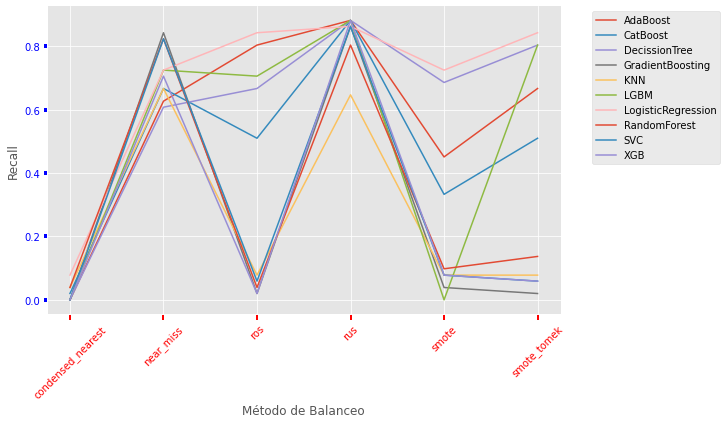

In [112]:
import matplotlib.pyplot as plt
import matplotlib as mpl
tabla_dash.pivot_table('Recall', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('Recall')
plt.show()

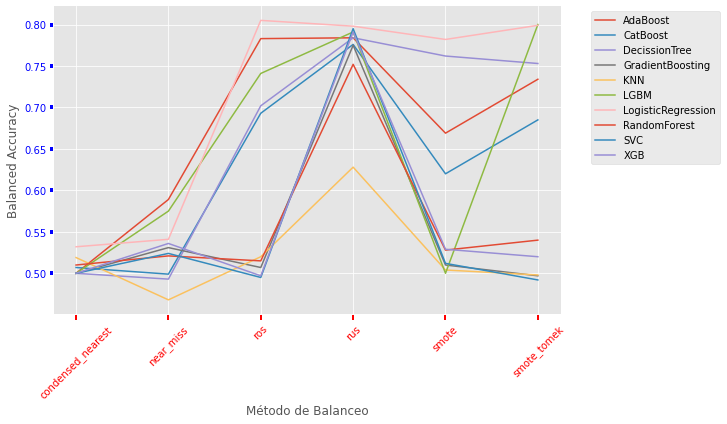

In [113]:
tabla_dash.pivot_table('Balanced Accuracy', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('Balanced Accuracy')
plt.show()

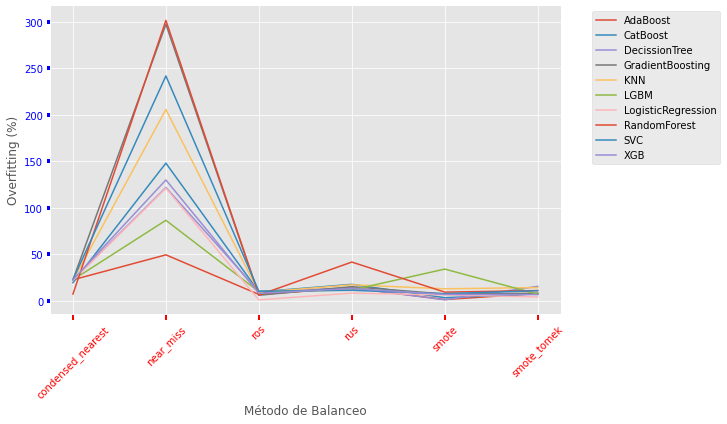

In [117]:
tabla_dash.pivot_table('Overfitting (%)', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('Overfitting (%)')
plt.show()

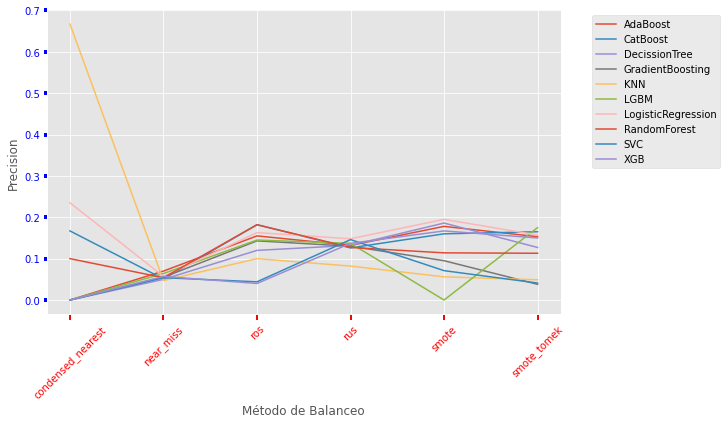

In [119]:
tabla_dash.pivot_table('Precision', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('Precision')
plt.show()

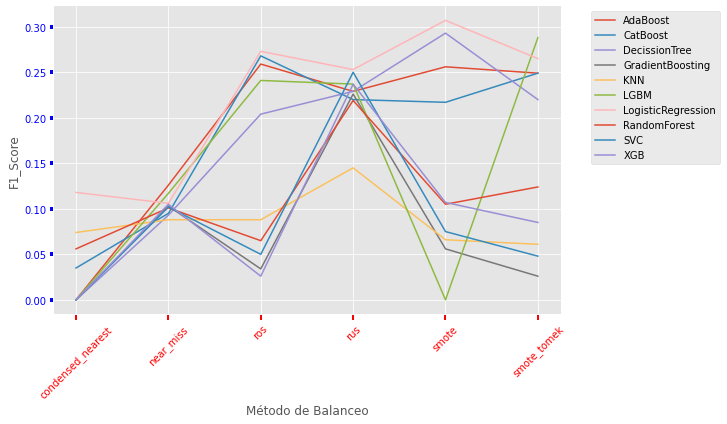

In [120]:
tabla_dash.pivot_table('F1', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('F1_Score')
plt.show()

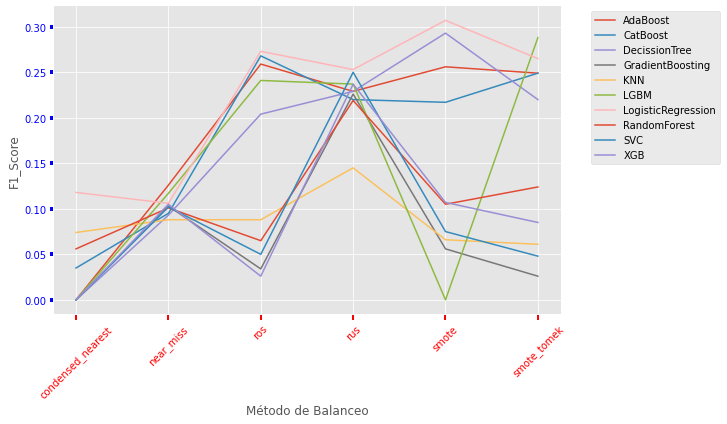

In [121]:
tabla_dash.pivot_table('F1', index='Método de Balanceo',
                    columns='Algoritmo', aggfunc='mean').plot(figsize=(10,6))

plt.tick_params(axis="x", length=6, width=2, colors='r', labelrotation=45.0)
plt.tick_params(axis="y", length=3, width=4, colors='b')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.tight_layout()
plt.ylabel('F1_Score')
plt.show()

In [125]:
import plotly.express as px
fig = px.scatter_3d(tabla_dash, x='Balanced Accuracy', y='Overfitting (%)', z='Recall',
              color='Algoritmo', color_continuous_scale='bluered', opacity=0.5 , size_max=18,)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0) , 
                 scene = dict(
                    xaxis_title='Balance Accuracy',
                    yaxis_title='Overfitting %',
                    zaxis_title='Recall'), 
                 width=900)
fig.show()

In [126]:
tabla_dash.describe()

,Accuracy Sin GridSearch,Accuracy GridSearch,Accuracy,Balanced Accuracy,Recall,F1,Precision,ROC_AUC,Overfitting (%)
count,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.00000
mean,0.759483,0.830283,0.763800,0.608517,0.435583,0.136150,0.111483,0.608517,38.89820
std,0.214387,0.086839,0.209354,0.122833,0.362157,0.096095,0.094981,0.122833,68.75742
min,0.228000,0.625000,0.249000,0.468000,0.000000,0.000000,0.000000,0.468000,1.02600
25%,0.712250,0.777750,0.703750,0.503000,0.054000,0.059750,0.053250,0.503000,7.58725
50%,0.839500,0.812000,0.837000,0.531500,0.559000,0.105500,0.117000,0.531500,12.27150
75%,0.919000,0.910000,0.932250,0.752250,0.804000,0.231000,0.153500,0.752250,22.56600
max,0.949000,0.994000,0.950000,0.805000,0.882000,0.307000,0.667000,0.805000,301.61300


# Mejores modelos de balanceo y algoritmos para Ictus DataSet --Equipo Cerebro

In [130]:
best_models_ever = tabla_dash[(tabla_dash['Balanced Accuracy']>0.7) & (tabla_dash['F1']>0.15)
                                     & (tabla_dash['Recall']>0.7) & (tabla_dash['Overfitting (%)']<=10)].sort_values('Balanced Accuracy', ascending = False) 
                                                                                
best_models_ever

,Método de Balanceo,Algoritmo,Accuracy Sin GridSearch,Accuracy GridSearch,Accuracy,Balanced Accuracy,Recall,F1,Precision,ROC_AUC,Overfitting (%)
1,ros,LogisticRegression,0.770,0.778,0.770,0.805,0.843,0.273,0.163,0.805,1.026
59,smote_tomek,LGBM,0.919,0.845,0.796,0.800,0.804,0.288,0.175,0.800,7.147
51,smote_tomek,LogisticRegression,0.765,0.791,0.760,0.799,0.843,0.265,0.157,0.799,4.129
11,rus,LogisticRegression,0.731,0.779,0.739,0.798,0.863,0.253,0.148,0.798,8.261
6,ros,AdaBoost,0.770,0.814,0.765,0.783,0.804,0.259,0.155,0.783,6.865
21,smote,LogisticRegression,0.831,0.776,0.832,0.782,0.725,0.307,0.195,0.782,6.402
9,ros,LGBM,0.916,0.839,0.772,0.741,0.706,0.241,0.145,0.741,9.893


In [131]:
best_models = best_models_ever.to_csv("mejores_modelos_tabla")

In [92]:
df= pd.read_csv('/kaggle/input/ictus-data-set/stroke_dataset.csv')

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder , LabelEncoder
from sklearn.compose import ColumnTransformer

numericas = ["age" ,"avg_glucose_level" , "bmi" , "hypertension", "heart_disease"]
categoricas= ["work_type" , "smoking_status" , "gender", "ever_married" , "Residence_type"]

#Configuro los transformer
transformer_numerico = ("transformer_numerico",MinMaxScaler(), numericas) 
transformer_categorico = ("transformer_categorico",OneHotEncoder(), categoricas)

#Defino el transformer
transformer = ColumnTransformer ([transformer_numerico, transformer_categorico ], remainder="passthrough")

In [93]:
X = df.drop('stroke',axis=1)
y= df['stroke']
X = transformer.fit_transform(X) 
pd.DataFrame(X, columns= transformer.get_feature_names_out())

,transformer_numerico__age,transformer_numerico__avg_glucose_level,transformer_numerico__bmi,transformer_numerico__hypertension,transformer_numerico__heart_disease,transformer_categorico__work_type_Govt_job,transformer_categorico__work_type_Private,transformer_categorico__work_type_Self-employed,transformer_categorico__work_type_children,transformer_categorico__smoking_status_Unknown,transformer_categorico__smoking_status_formerly smoked,transformer_categorico__smoking_status_never smoked,transformer_categorico__smoking_status_smokes,transformer_categorico__gender_Female,transformer_categorico__gender_Male,transformer_categorico__ever_married_No,transformer_categorico__ever_married_Yes,transformer_categorico__Residence_type_Rural,transformer_categorico__Residence_type_Urban
0,0.816895,0.801265,0.647564,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
1,0.975586,0.234512,0.530086,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
2,0.597168,0.536008,0.584527,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
3,0.963379,0.549349,0.286533,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
4,0.987793,0.605161,0.429799,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,0.499512,0.069384,0.452722,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
4977,0.487305,0.627966,0.489971,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4978,0.548340,0.184194,0.510029,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0
4979,0.487305,0.133044,0.458453,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0


In [94]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=101, stratify=y)

In [48]:
from imblearn.over_sampling import RandomOverSampler
os =  RandomOverSampler(random_state=0)

X_train_os, y_train_os = os.fit_resample(X_train,y_train) 

In [49]:
from imblearn.under_sampling import RandomUnderSampler  

rus = RandomUnderSampler(sampling_strategy=1) # Float 
 
X_train_rus, y_train_rus = rus.fit_resample(X_train,y_train) 

In [11]:
from imblearn.combine import SMOTETomek

os_us = SMOTETomek()

X_train_st, y_train_st = os_us.fit_resample(X_train,y_train)  

In [ ]:
#Funcion para medir desviacion estandar del 
#st_dev = statistics.pstdev(list)

# LGBM con `Random_Over_Sampler`

In [132]:
param_grid = {'learning_rate' : [1],
              'n_estimators'  : [500],
               'num_leaves': [2], # large num_leaves helps improve accuracy but might lead to over-fitting
              'boosting_type' : ['gbdt'], # for better accuracy -> try dart
              'objective' : ['binary'],
               # large max_bin helps improve accuracy but might slow down training progress
              'colsample_bytree' : [1],
              'subsample'     : [1],
              'reg_alpha' : [1],
              'reg_lambda' : [2],
              'scale_pos_weight' : [191],
              
    }

grid_LGBMC_os = GridSearchCV(
        estimator  = LGBMClassifier(random_state=42),
        param_grid = param_grid,
        scoring    = 'recall',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=100, n_repeats=1, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid_LGBMC_os.fit(X = X_train_os, y = y_train_os)

# Resultados
# ==============================================================================
print("Resultados GridSearch ---->>> GradientBoostingClassifier")
resultados_os = pd.DataFrame(grid_LGBMC_os.cv_results_)
resultados_os.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)
# Mejores hiperparámetros por validación cruzada GradientBoostingClassifier
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier")
print("----------------------------------------")
print(grid_LGBMC_os.best_params_, ":", grid_LGBMC_os.best_score_, grid_LGBMC_os.scoring)

# Guardamos el mejor modelo
modelo_LGBMC_os = grid_LGBMC_os.best_estimator_
#Accuracy del modelo
LGBMC_accuracy_os = grid_LGBMC_os.best_score_

Resultados GridSearch ---->>> GradientBoostingClassifier
----------------------------------------
Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier
----------------------------------------
{'boosting_type': 'gbdt', 'colsample_bytree': 1, 'learning_rate': 1, 'n_estimators': 500, 'num_leaves': 2, 'objective': 'binary', 'reg_alpha': 1, 'reg_lambda': 2, 'scale_pos_weight': 191, 'subsample': 1} : 1.0 recall


In [133]:
#cross_validation con el mejor modelo del grid search
cv_LGBMC_os = cross_validate(modelo_LGBMC_os, X, y, cv=100)
sorted(cv_LGBMC_os.keys())
cv_scores =cv_LGBMC_os['test_score']
# Accuracy cross_validation
cv_accuracy = np.mean(cv_scores)
# Overffiting cross_validation
cv_overfitting = np.std(cv_scores)

-----------------------------------------------------
Balanced_accuracy de test es: 73.34 %

Overfitting balanced -0.52 % 
-----------------------------------------------------
F1_score: 73.34 %
-----------------------------------------------------
Accuracy_test es: 51.15 %

Accuracy_train es: 73.72 %

Overfitting -44.11 % 
-----------------------------------------------------
Accuracy del cross_validate es: 62.83 %

El overfitting del cross_validate (test) y train es 31.24 % 
-----------------------------------------------------

Matriz de confusión



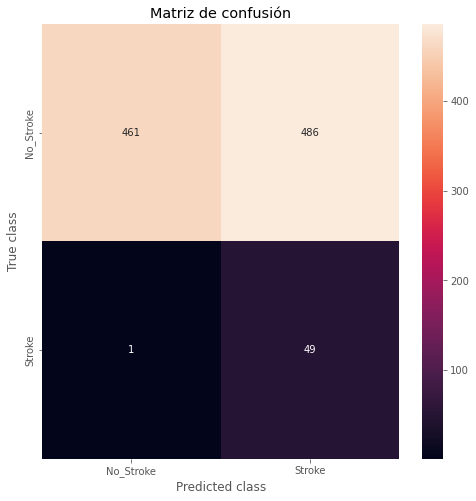


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.49      0.65       947
           1       0.09      0.98      0.17        50

    accuracy                           0.51       997
   macro avg       0.54      0.73      0.41       997
weighted avg       0.95      0.51      0.63       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.47      0.64      3786
           1       0.66      1.00      0.79      3786

    accuracy                           0.74      7572
   macro avg       0.83      0.74      0.72      7572
weighted avg       0.83      0.74      0.72      7572




In [134]:
# Prediccion y evaluacion del modelo
y_pred_bbc= modelo_LGBMC_os.predict(X_test)
y_pred_train_bbc= modelo_LGBMC_os.predict(X_train_os)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_os,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_os, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test, y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy))
print("")
print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting) *100))
print("-----------------------------------------------------")
print("")

#definimos funciona para mostrar los resultados
print("Matriz de confusión")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test, y_pred_bbc))
    
mostrar_resultados(y_test, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_os,y_pred_train_bbc))
print("")

# LGBM con `Random_Under_Sampler`

In [135]:
param_grid = {'learning_rate' : [1],
              'n_estimators'  : [500],
               'num_leaves': [2], # large num_leaves helps improve accuracy but might lead to over-fitting
              'boosting_type' : ['gbdt'], # for better accuracy -> try dart
              'objective' : ['binary'],
               # large max_bin helps improve accuracy but might slow down training progress
              'colsample_bytree' : [1],
              'subsample'     : [1],
              'reg_alpha' : [1],
              'reg_lambda' : [2],
              'scale_pos_weight' : [191],
              
    }

grid_LGBMC_rus = GridSearchCV(
        estimator  = LGBMClassifier(random_state=42),
        param_grid = param_grid,
        scoring    = 'recall',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=100, n_repeats=1, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid_LGBMC_rus.fit(X = X_train_rus, y = y_train_rus)

# Resultados
# ==============================================================================
print("Resultados GridSearch ---->>> GradientBoostingClassifier")
resultados_rus = pd.DataFrame(grid_LGBMC_rus.cv_results_)
resultados_rus.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)
# Mejores hiperparámetros por validación cruzada GradientBoostingClassifier
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier")
print("----------------------------------------")
print(grid_LGBMC_rus.best_params_, ":", grid_LGBMC_rus.best_score_, grid_LGBMC_rus.scoring)

# Guardamos el mejor modelo
modelo_LGBMC_rus = grid_LGBMC_rus.best_estimator_
#Accuracy del modelo
LGBMC_accuracy_rus = grid_LGBMC_rus.best_score_

Resultados GridSearch ---->>> GradientBoostingClassifier
----------------------------------------
Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier
----------------------------------------
{'boosting_type': 'gbdt', 'colsample_bytree': 1, 'learning_rate': 1, 'n_estimators': 500, 'num_leaves': 2, 'objective': 'binary', 'reg_alpha': 1, 'reg_lambda': 2, 'scale_pos_weight': 191, 'subsample': 1} : 0.8583333333333333 recall


In [136]:
#cross_validation con el mejor modelo del grid search
cv_LGBMC_rus = cross_validate(modelo_LGBMC_rus, X, y, cv=100)
sorted(cv_LGBMC_rus.keys())
cv_scores_rus =cv_LGBMC_rus['test_score']
# Accuracy cross_validation
cv_accuracy_rus = np.mean(cv_scores_rus)
# Overffiting cross_validation
cv_overfitting_rus = np.std(cv_scores_rus)

-----------------------------------------------------
Balanced_accuracy de test es: 70.06 %

Overfitting balanced -5.24 % 
-----------------------------------------------------
F1_score: 70.06 %
-----------------------------------------------------
recall: 100.00 %
-----------------------------------------------------
Accuracy_test es: 43.13 %

Accuracy_train es: 73.74 %

Overfitting -70.97 % 
-----------------------------------------------------
Accuracy del cross_validate es: 62.83 %

El overfitting del cross_validate (test) y train es 31.24 % 
-----------------------------------------------------




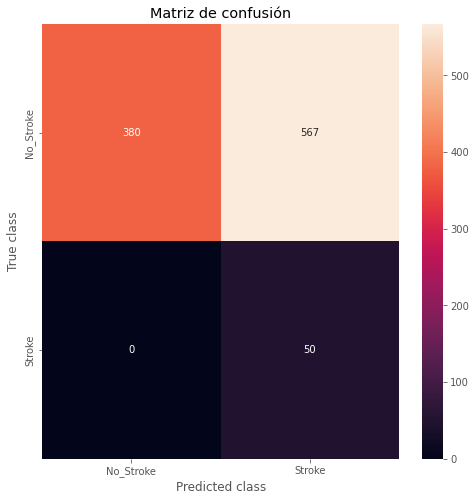


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.40      0.57       947
           1       0.08      1.00      0.15        50

    accuracy                           0.43       997
   macro avg       0.54      0.70      0.36       997
weighted avg       0.95      0.43      0.55       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.47      0.64       198
           1       0.66      1.00      0.79       198

    accuracy                           0.74       396
   macro avg       0.83      0.74      0.72       396
weighted avg       0.83      0.74      0.72       396




In [137]:
# Prediccion y evaluacion del modelo
y_pred_bbc= modelo_LGBMC_rus.predict(X_test)
y_pred_train_bbc= modelo_LGBMC_rus.predict(X_train_rus)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_rus,y_pred_train_bbc)


#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)

balanced_accuracy_train= balanced_accuracy_score(y_train_rus, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test, y_pred_bbc)
#recall
recall= recall_score(y_test , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_rus))
print("")
print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_rus) *100))
print("-----------------------------------------------------")
print("")

#definimos funciona para mostrar los resultados
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test, y_pred_bbc))
    
mostrar_resultados(y_test, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_rus,y_pred_train_bbc))
print("")

# LGBM con `SMOTETomek`

In [41]:
param_grid = {'learning_rate' : [1],
              'n_estimators'  : [500],
               'num_leaves': [2], # large num_leaves helps improve accuracy but might lead to over-fitting
              'boosting_type' : ['gbdt'], # for better accuracy -> try dart
              'objective' : ['binary'],
               # large max_bin helps improve accuracy but might slow down training progress
              'colsample_bytree' : [1],
              'subsample'     : [1],
              'reg_alpha' : [1],
              'reg_lambda' : [2],
              'scale_pos_weight' : [191],
              
    }

grid_LGBMC_st = GridSearchCV(
        estimator  = LGBMClassifier(random_state=42),
        param_grid = param_grid,
        scoring    = 'recall',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=100, n_repeats=1, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid_LGBMC_st.fit(X = X_train_st, y = y_train_st)

# Resultados
# ==============================================================================
print("Resultados GridSearch ---->>> GradientBoostingClassifier")
resultados_os = pd.DataFrame(grid_LGBMC_st.cv_results_)
resultados_os.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)
# Mejores hiperparámetros por validación cruzada GradientBoostingClassifier
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier")
print("----------------------------------------")
print(grid_LGBMC_st.best_params_, ":", grid_LGBMC_st.best_score_, grid_LGBMC_st.scoring)

# Guardamos el mejor modelo
modelo_LGBMC_st = grid_LGBMC_st.best_estimator_
#Accuracy del modelo
LGBMC_accuracy_st = grid_LGBMC_st.best_score_

Resultados GridSearch ---->>> GradientBoostingClassifier
----------------------------------------
Mejores hiperparámetros encontrados (cv) GradientBoostingClassifier
----------------------------------------
{'boosting_type': 'gbdt', 'colsample_bytree': 1, 'learning_rate': 1, 'n_estimators': 500, 'num_leaves': 2, 'objective': 'binary', 'reg_alpha': 1, 'reg_lambda': 2, 'scale_pos_weight': 191, 'subsample': 1} : 0.9981285002370034 recall


In [65]:
#cross_validation con el mejor modelo del grid search
cv_LGBMC_st = cross_validate(modelo_LGBMC_st, X, y, cv=100)
sorted(cv_LGBMC_st.keys())
cv_scores_st =cv_LGBMC_st['test_score']
# Accuracy cross_validation
cv_accuracy_st = np.mean(cv_scores_st)
# Overffiting cross_validation
cv_overfitting_st = np.std(cv_scores_st)

-----------------------------------------------------
Balanced_accuracy de test es: 71.17 %

Overfitting balanced -1.35 % 
-----------------------------------------------------
F1_score: 71.17 %
-----------------------------------------------------
recall: 100.00 %
-----------------------------------------------------
Accuracy_test es: 45.24 %

Accuracy_train es: 72.13 %

Overfitting -59.45 % 
-----------------------------------------------------
Accuracy del cross_validate es: 62.83 %

El overfitting del cross_validate (test) y train es 31.24 % 
-----------------------------------------------------



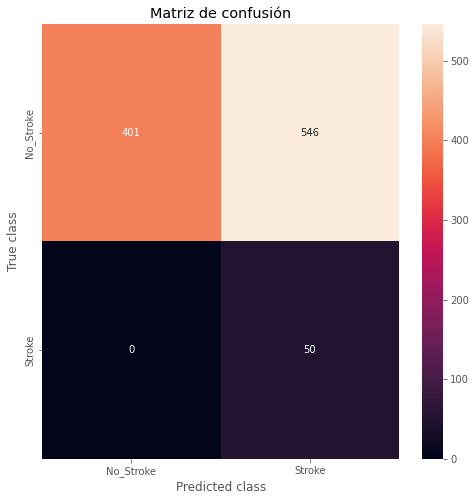


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.42      0.59       947
           1       0.08      1.00      0.15        50

    accuracy                           0.45       997
   macro avg       0.54      0.71      0.37       997
weighted avg       0.95      0.45      0.57       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.44      0.61      3737
           1       0.64      1.00      0.78      3737

    accuracy                           0.72      7474
   macro avg       0.82      0.72      0.70      7474
weighted avg       0.82      0.72      0.70      7474




In [67]:
# Prediccion y evaluacion del modelo
y_pred_bbc= modelo_LGBMC_st.predict(X_test)
y_pred_train_bbc= modelo_LGBMC_st.predict(X_train_st)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_st,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_st, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test, y_pred_bbc)
#recall
recall= recall_score(y_test , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_st))
print("")
print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_st) *100))
print("-----------------------------------------------------")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test, y_pred_bbc))
    
mostrar_resultados(y_test, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_st,y_pred_train_bbc))
print("")

In [ ]:
from sklearn.metrics import balanced_accuracy_score
def bagging(models):
    list_bbc=[]
    list_model=[]
    for indx,model in enumerate(models):
        # Instanciamos el BalancedBaggingClassifier
        bbc = BalancedBaggingClassifier(base_estimator=model,
                                sampling_strategy='auto',
                                replacement=False,
                                random_state=0)

        # Grid de hiperparámetros evaluados
        # ==============================================================================
        bc_params = {"base_estimatormax_depth": [3,5,10,20],
          "base_estimatormax_features": [None, "auto"],
          "base_estimatormin_samples_leaf": [1, 3, 5, 7, 10],
          "base_estimatormin_samples_split": [2, 5, 7],
          'bootstrap_features': [False, True],
          'max_features': [0.5, 0.7, 1.0],
          'max_samples': [0.5, 0.7, 1.0],
          'n_estimators': [2, 5, 10, 20],
        }


        # Búsqueda por grid search con validación cruzada
        # ==============================================================================
        grid_bbc = GridSearchCV(
            estimator  = bbc,
            param_grid = bc_params,
            scoring    = 'accuracy',
            n_jobs     = multiprocessing.cpu_count() - 1,
            cv         = RepeatedKFold(n_splits=3, n_repeats=1, random_state=123), 
            refit      = True,
            verbose    = 0,
            return_train_score = True
           )
        
        bbc_train=grid_bbc.fit(X = X_train, y = y_train)
        y_pred= grid_acc.predict(X_test)
        y_pred_train= grid_acc.predict(X_train)
        modelo = grid_acc.best_estimator_
        #Accuracy del modelo
        accuracy_model = grid_acc.best_score_
        accuracy_test= accuracy_score(y_test, y_pred)
        accuracy_train = accuracy_score(y_train,y_pred_train)
        balaced_acc = balanced_accuracy_score(y_test, y_pred)
        overffiting_acc= np.abs((( balaced_acc - accuracy_train)/balaced_acc) *100)
        # Metricas recall_score y f1_score
        recall = recall_score(y_test, y_pred)
        f1= f1_score(y_test, y_pred)
        precission =precision_score(y_test, y_pred)
        bal_accuracy = balanced_accuracy_score(y_test, y_pred)                    
        result.iloc[row,1] = accuracy_model
        result.iloc[row,2]=  accuracy_test
        result.iloc[row,3]=  accuracy_train
        result.iloc[row,4]=  overffiting_acc
        result.iloc[row,5] = recall
        result.iloc[row,6] = f1
        result.iloc[row,7] = precission
        result.iloc[row,8] = bal_accuracy
        result.iloc[row,9] = roc_auc_score(y_test, y_pred)
        
        row += 1
        col_grid +=1
        list_model.append(modelo)
        result.head()
        result.to_csv(name)
        list_bbc.append(bbc_train)
    return (lista_bbc,list_model)

# Información de los mejores modelos detectados con el grid search y los metodos de balanceo

In [55]:
modelos_st = pd.read_pickle("../input/modelos-ictus/lista_model_smoteTomek.pickle")
modelos_st

[[SVC(C=1000, gamma=1),
  LogisticRegression(C=0.1, solver='newton-cg'),
  DecisionTreeClassifier(max_depth=5, random_state=0),
  KNeighborsClassifier(metric='manhattan', n_neighbors=1),
  GradientBoostingClassifier(max_depth=10, max_features='auto', n_estimators=1000,
                             random_state=123, subsample=0.5),
  RandomForestClassifier(criterion='entropy', max_features='log2',
                         n_estimators=1000),
  AdaBoostClassifier(learning_rate=0.1, n_estimators=1000),
  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
                colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
                importance_type=None, interaction_constraints='',
                learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
                max_delta_step=0, max_depth=5, max_leaves=0, min_chi

In [ ]:
param_grid = {#'learning_rate' : [1],
              #'n_estimators'  : [500],
               'num_leaves': [2], # large num_leaves helps improve accuracy but might lead to over-fitting
              #'boosting_type' : ['gbdt'], # for better accuracy -> try dart
              #'objective' : ['binary'],
               # large max_bin helps improve accuracy but might slow down training progress
              #'colsample_bytree' : [1],
              'subsample'     : [1],
              'reg_alpha' : [1],
              'reg_lambda' : [2],
              'scale_pos_weight' : [191],
              

# Regularizacion

In [12]:
LGBM_smoteTomek = LGBMClassifier(colsample_bytree=1, learning_rate=0.001, max_bin=510,
                 n_estimators=50, num_leaves=2, objective='binary', reg_alpha=1,
                 reg_lambda=2, subsample=1 , boosting_type= ['gbdt'] , scale_pos_weight = [20])

LGBM_smoteTomek

LGBMClassifier(boosting_type=['gbdt'], colsample_bytree=1, learning_rate=0.001,
               max_bin=510, n_estimators=50, num_leaves=2, objective='binary',
               reg_alpha=1, reg_lambda=2, scale_pos_weight=[20], subsample=1)

In [59]:
LGBM_smoteTomek = LGBMClassifier(colsample_bytree=1, learning_rate=0.001, max_bin=510,
                 n_estimators=50, num_leaves=2, objective='binary', reg_alpha=1,
                 reg_lambda=2, subsample=1 , boosting_type= ['gbdt'] , scale_pos_weight = [20])

eval_set = X_test , y_test

LGBM_smoteTomek.fit(X = X_train_st, y = y_train_st ,early_stopping_rounds=10, eval_metric="logloss", eval_set=eval_set, verbose=True)

[1]	valid_0's binary_logloss: 0.693461
[2]	valid_0's binary_logloss: 0.693775
[3]	valid_0's binary_logloss: 0.694089
[4]	valid_0's binary_logloss: 0.694403
[5]	valid_0's binary_logloss: 0.694718
[6]	valid_0's binary_logloss: 0.695033
[7]	valid_0's binary_logloss: 0.695348
[8]	valid_0's binary_logloss: 0.695664
[9]	valid_0's binary_logloss: 0.695979
[10]	valid_0's binary_logloss: 0.696295
[11]	valid_0's binary_logloss: 0.696611


/opt/conda/lib/python3.7/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/conda/lib/python3.7/site-packages/lightgbm/sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


LGBMClassifier(boosting_type=['gbdt'], colsample_bytree=1, learning_rate=0.001,
               max_bin=510, n_estimators=50, num_leaves=2, objective='binary',
               reg_alpha=1, reg_lambda=2, scale_pos_weight=[20], subsample=1)

In [68]:
LGBM_smoTomek = LGBMClassifier(colsample_bytree=1, learning_rate=1, max_bin=510,
                 n_estimators=500, num_leaves=2, objective='binary', reg_alpha=1,
                 reg_lambda=2, subsample=1 , boosting_type= ['gbdt'] , scale_pos_weight = [191])

LGBM_smoTomek.fit(X = X_train_st, y = y_train_st)

LGBMClassifier(boosting_type=['gbdt'], colsample_bytree=1, learning_rate=1,
               max_bin=510, n_estimators=500, num_leaves=2, objective='binary',
               reg_alpha=1, reg_lambda=2, scale_pos_weight=[191], subsample=1)

In [ ]:
pip install xgboost

In [14]:
# Algoritmos de ensemble
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier
import xgboost as xgb
from xgboost import XGBClassifier
import lightgbm 
import catboost
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [76]:
modelo = XGBClassifier()

#eval_set = X_test , y_test

modelo.fit(X_train_st, y_train_st)

#early_stopping_rounds=10, eval_set=eval_set, verbose=True



XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [ ]:
CatBC = CatBoostClassifier(learning_rate=0.001, depth = 4 , iteration = 40)

CatBC.fit(X = X_train_ov, y = y_train_ov)

-----------------------------------------------------
Balanced_accuracy de test es: 54.15 %

Overfitting balanced -84.17 % 
-----------------------------------------------------
F1_score: 54.15 %
-----------------------------------------------------
recall: 12.00 %
-----------------------------------------------------
Accuracy_test es: 92.08 %

Accuracy_train es: 99.73 %

Overfitting -8.32 % 
-----------------------------------------------------

-----------------------------------------------------



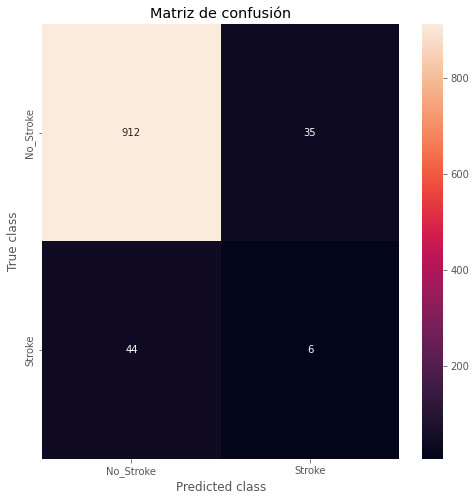


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       947
           1       0.15      0.12      0.13        50

    accuracy                           0.92       997
   macro avg       0.55      0.54      0.55       997
weighted avg       0.91      0.92      0.92       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3737
           1       1.00      1.00      1.00      3737

    accuracy                           1.00      7474
   macro avg       1.00      1.00      1.00      7474
weighted avg       1.00      1.00      1.00      7474




In [77]:
# Prediccion y evaluacion del modelo
y_pred_bbc= modelo.predict(X_test)
y_pred_train_bbc= modelo.predict(X_train_st)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_st,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_st, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test, y_pred_bbc)
#recall
recall= recall_score(y_test , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
#print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_rus))
print("")
#print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_rus) *100))
print("-----------------------------------------------------")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test, y_pred_bbc))
    
mostrar_resultados(y_test, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_st,y_pred_train_bbc))
print("")

# Guardamos el transformer en formato .pickled

In [97]:
import joblib
joblib.dump(transformer, 'transformer_entrenado.pkl') # Guardo el modelo.

transformer_recuperado = joblib.load('transformer_entrenado.pkl')

# Ensayamos el transformer guardado

In [99]:
df= pd.read_csv('/kaggle/input/ictus-data-set/stroke_dataset.csv')
X_prueba_transformer = df.drop('stroke',axis=1)
y= df['stroke']
X_prueba_transformer = transformer_recuperado.fit_transform(X_prueba_transformer) 
pd.DataFrame(X_prueba_transformer, columns= transformer_recuperado.get_feature_names_out())

,transformer_numerico__age,transformer_numerico__avg_glucose_level,transformer_numerico__bmi,transformer_numerico__hypertension,transformer_numerico__heart_disease,transformer_categorico__work_type_Govt_job,transformer_categorico__work_type_Private,transformer_categorico__work_type_Self-employed,transformer_categorico__work_type_children,transformer_categorico__smoking_status_Unknown,transformer_categorico__smoking_status_formerly smoked,transformer_categorico__smoking_status_never smoked,transformer_categorico__smoking_status_smokes,transformer_categorico__gender_Female,transformer_categorico__gender_Male,transformer_categorico__ever_married_No,transformer_categorico__ever_married_Yes,transformer_categorico__Residence_type_Rural,transformer_categorico__Residence_type_Urban
0,0.816895,0.801265,0.647564,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
1,0.975586,0.234512,0.530086,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
2,0.597168,0.536008,0.584527,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
3,0.963379,0.549349,0.286533,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
4,0.987793,0.605161,0.429799,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,0.499512,0.069384,0.452722,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
4977,0.487305,0.627966,0.489971,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4978,0.548340,0.184194,0.510029,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0
4979,0.487305,0.133044,0.458453,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0


# Guradamos el modelo seleccionado

In [162]:
import joblib
joblib.dump(modelo_LGBMC_st, 'modelo_entrenado.pkl') # Guardo el modelo.

modelo_recuperado = joblib.load('modelo_entrenado.pkl') #cargamos el modelo guardado para su aplicacion

In [111]:
# Prediccion y evaluacion del modelo
y_pred_bbc= modelo_recuperado.predict(X_test)
y_pred_train_bbc= modelo_recuperado.predict(X_train_st)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_st,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_st, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test, y_pred_bbc)
#recall
recall= recall_score(y_test , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_rus))
print("")
print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_rus) *100))
print("-----------------------------------------------------")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test, y_pred_bbc))
    
mostrar_resultados(y_test, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_st,y_pred_train_bbc))
print("")

NameError: name 'modelo_recuperado' is not defined

In [165]:
pip install deepchecks

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 30.1 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 25.7 MB/s eta 0:00:0000:0100:01
  Created wheel for PyNomaly: filename=PyNomaly-0.3.3-py3-none-any.whl size=8498 sha256=82ea5f74a6cafd0d1c2dcd0c36e33cf62840369943ba1872190ae823e955c0c3
  Stored in directory: /root/.cache/pip/wheels/42/29/a3/561def29f8cce748430b2557cbb7e2203116634ee055b29439
Successfully built PyNomaly
  Attempting uninstall: plotly
    Found existing installation: plotly 5.10.0
    Uninstalling plotly-5.10.0:
      Successfully uninstalled plotly-5.10.0
Note: you may need to restart the kernel to use updated packages.


In [15]:
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder , LabelEncoder
from sklearn.compose import ColumnTransformer

var_numer = ["age", "avg_glucose_level" , "bmi" , "hypertension", "heart_disease" , "stroke"]

var_categ= ["work_type" , "smoking_status" , "gender", "ever_married" , "Residence_type" ]

#Configuro los transformer
transformer_var_numer = ("transformer_var_numer",MinMaxScaler(), var_numer) 
transformer_var_categ = ("transformer_var_categ",OneHotEncoder(), var_categ)

#Defino el transformer
transformer_variables = ColumnTransformer ([transformer_var_numer, transformer_var_categ ], remainder="passthrough")

In [171]:
df_tranformed = transformer_variables.fit_transform(df) 
peso_variables= pd.DataFrame(df_tranformed, columns= transformer_variables.get_feature_names_out())
variables = peso_variables.to_csv("peso_variables")

,transformer_var_numer__age,transformer_var_numer__avg_glucose_level,transformer_var_numer__bmi,transformer_var_numer__hypertension,transformer_var_numer__heart_disease,transformer_var_numer__stroke,transformer_var_categ__work_type_Govt_job,transformer_var_categ__work_type_Private,transformer_var_categ__work_type_Self-employed,transformer_var_categ__work_type_children,transformer_var_categ__smoking_status_Unknown,transformer_var_categ__smoking_status_formerly smoked,transformer_var_categ__smoking_status_never smoked,transformer_var_categ__smoking_status_smokes,transformer_var_categ__gender_Female,transformer_var_categ__gender_Male,transformer_var_categ__ever_married_No,transformer_var_categ__ever_married_Yes,transformer_var_categ__Residence_type_Rural,transformer_var_categ__Residence_type_Urban
0,0.816895,0.801265,0.647564,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
1,0.975586,0.234512,0.530086,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
2,0.597168,0.536008,0.584527,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
3,0.963379,0.549349,0.286533,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
4,0.987793,0.605161,0.429799,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,0.499512,0.069384,0.452722,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
4977,0.487305,0.627966,0.489971,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4978,0.548340,0.184194,0.510029,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0
4979,0.487305,0.133044,0.458453,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0


In [190]:
import joblib
from deepchecks.checks import RocReport
from deepchecks import Dataset

modelo_recuperado = joblib.load('modelo_entrenado.pkl') #cargamos el modelo guardado para su aplicacion

peso_variables = pd.read_csv('../peso_variables.csv')

RocReport().run(Dataset(peso_variables, label='transformer_var_numer__stroke'), modelo_recuperado)

Ability to import base tabular functionality from the `deepchecks` package directly is deprecated, please import from `deepchecks.tabular` instead
deepchecks - WARNING - It is recommended to initialize Dataset with categorical features by doing "Dataset(df, cat_features=categorical_list)". No categorical features were passed, therefore heuristically inferring categorical features in the data. 16 categorical features were inferred.: transformer_var_numer__hypertension, transformer_var_numer__heart_disease, transformer_var_categ__work_type_Govt_job, transformer_var_categ__work_type_Private, transformer_var_categ__work_type_Self-employed, transformer_var_categ__work_type_children, transformer_var_categ__smoking_status_Unknown... For full list use dataset.cat_features


Full Screen
 
 
 <iframe allowfullscreen id="deepchecks-result-iframe-91LV6"
height="600px"
width="100%"
allow="fullscreen"
frameborder="0"
srcdoc="<!--
 ~ ----------------------------------------------------------------------------
 ~ Copyright (C) 2021-2022 Deepchecks (https://www.deepchecks.com)
 ~
 ~ This file is part of Deepchecks.
 ~ Deepchecks is distributed under the terms of the GNU Affero General
 ~ Public License (version 3 or later).
 ~ You should have received a copy of the GNU Affero General Public License
 ~ along with Deepchecks. If not, see <http://www.gnu.org/licenses/>.
 ~ ----------------------------------------------------------------------------
 ~
-->
<!DOCTYPE html>
<html lang="en">
<head>
 <meta charset="UTF-8">
 <title>ROC Report</title>
 <style>
 body {
 font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Helvetica, Arial, sans-serif, 'Apple Color Emoji', 'Segoe UI Emoji', 'Segoe UI Symbol';
 font-size: 1rem;
 line-height: 1.5;
 color: #212529;
 text-align: left;
 max-width: 1200px;
 margin: auto;
 background-color: white;
 }

 div.nbinput.container div.prompt *,
 div.nboutput.container div.prompt *,
 div.nbinput.container div.input_area pre,
 div.nboutput.container div.output_area pre,
 div.nbinput.container div.input_area .highlight,
 div.nboutput.container div.output_area .highlight {
 border: none;
 padding: 0;
 margin: 0;
 box-shadow: none;
 }

 div.nbinput.container > div[class*=highlight],
 div.nboutput.container > div[class*=highlight] {
 margin: 0;
 }

 div.nbinput.container div.prompt *,
 div.nboutput.container div.prompt * {
 background: none;
 }

 div.nboutput.container div.output_area .highlight,
 div.nboutput.container div.output_area pre {
 background: unset;
 }

 div.nboutput.container div.output_area div.highlight {
 color: unset; /* override Pygments text color */
 }

 /* avoid gaps between output lines */
 div.nboutput.container div[class*=highlight] pre {
 line-height: normal;
 }

 /* input/output containers */
 div.nbinput.container,
 div.nboutput.container {
 display: -webkit-flex;
 display: flex;
 align-items: flex-start;
 margin: 0;
 width: 100%;
 }
 @media (max-width: 540px) {
 div.nbinput.container,
 div.nboutput.container {
 flex-direction: column;
 }
 }

 /* input container */
 div.nbinput.container {
 padding-top: 5px;
 }

 /* last container */
 div.nblast.container {
 padding-bottom: 5px;
 }

 /* input prompt */
 div.nbinput.container div.prompt pre {
 color: #307FC1;
 }

 /* output prompt */
 div.nboutput.container div.prompt pre {
 color: #BF5B3D;
 }

 /* all prompts */
 div.nbinput.container div.prompt,
 div.nboutput.container div.prompt {
 width: 4.5ex;
 padding-top: 5px;
 position: relative;
 user-select: none;
 }

 div.nbinput.container div.prompt > div,
 div.nboutput.container div.prompt > div {
 position: absolute;
 right: 0;
 margin-right: 0.3ex;
 }

 @media (max-width: 540px) {
 div.nbinput.container div.prompt,
 div.nboutput.container div.prompt {
 width: unset;
 text-align: left;
 padding: 0.4em;
 }
 div.nboutput.container div.prompt.empty {
 padding: 0;
 }

 div.nbinput.container div.prompt > div,
 div.nboutput.container div.prompt > div {
 position: unset;
 }
 }

 /* disable scrollbars on prompts */
 div.nbinput.container div.prompt pre,
 div.nboutput.container div.prompt pre {
 overflow: hidden;
 }

 /* input/output area */
 div.nbinput.container div.input_area,
 div.nboutput.container div.output_area {
 -webkit-flex: 1;
 flex: 1;
 overflow: auto;
 }
 @media (max-width: 540px) {
 div.nbinput.container div.input_area,
 div.nboutput.container div.output_area {
 width: 100%;
 }
 }

 /* input area */
 div.nbinput.container div.input_area {
 border: 1px solid #e0e0e0;
 border-radius: 2px;
 /*background: #f5f5f5;*/
 }

 /* override MathJax center alignment in output cells */
 div.nboutput.container div[class*=MathJax] {
 text-align: left !important;
 }

 /* override sphinx.ext.imgmath center alignment in output cells */
 div.nboutput.container div.math p

In [185]:
pip install plot_metric

Note: you may need to restart the kernel to use updated packages.


In [183]:
# Use predict_proba to predict probability of the class
y_pred_ROC = modelo_recuperado.predict_proba(X_test)[:,1]


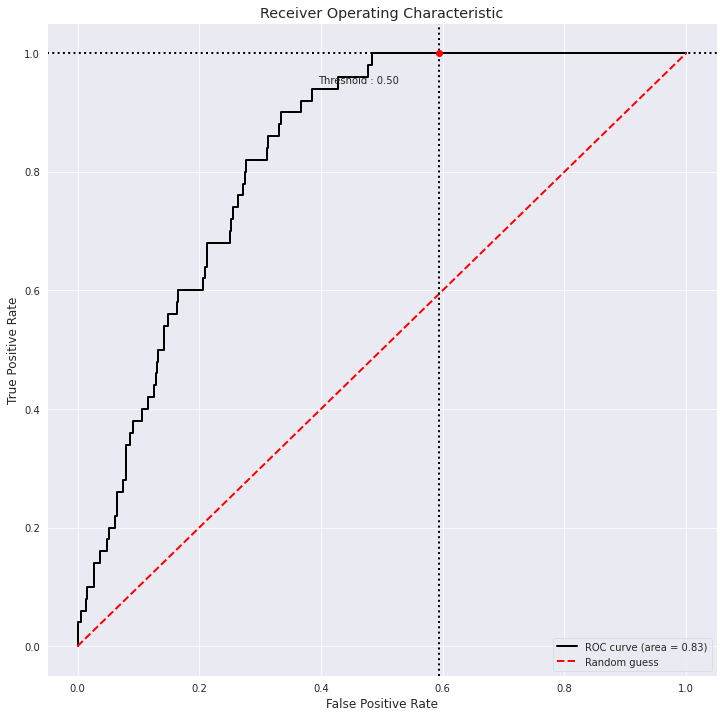

In [205]:
from plot_metric.functions import BinaryClassification
# Visualisation with plot_metric
bc = BinaryClassification(y_test, y_pred_ROC, labels=["Class 1", "Class 2"])

# Figures
plt.figure(figsize=(12,12))
bc.plot_roc_curve()
plt.show()


# Feature Importance del Modelo

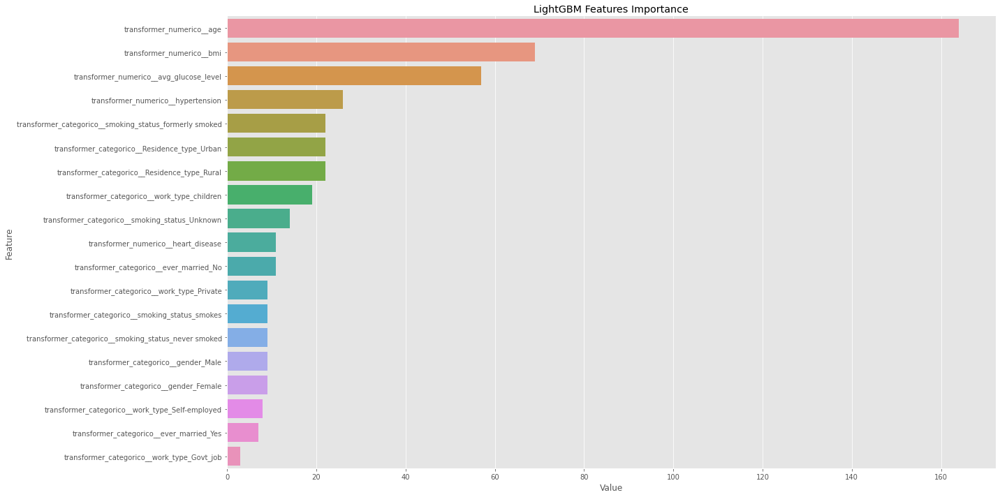

<Figure size 1008x504 with 0 Axes>

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp = pd.DataFrame(sorted(zip(LGBM_smoTomek.feature_importances_,X_plot.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features Importance')
plt.tight_layout()
plt.show()
plt.savefig('lgbm_importances-01.png')

In [73]:
feature_imp.sort_values(by="Value", ascending=False)

,Value,Feature
18,164,transformer_numerico__age
17,69,transformer_numerico__bmi
16,57,transformer_numerico__avg_glucose_level
15,26,transformer_numerico__hypertension
14,22,transformer_categorico__smoking_status_formerl...
13,22,transformer_categorico__Residence_type_Urban
12,22,transformer_categorico__Residence_type_Rural
11,19,transformer_categorico__work_type_children
10,14,transformer_categorico__smoking_status_Unknown
9,11,transformer_numerico__heart_disease


<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

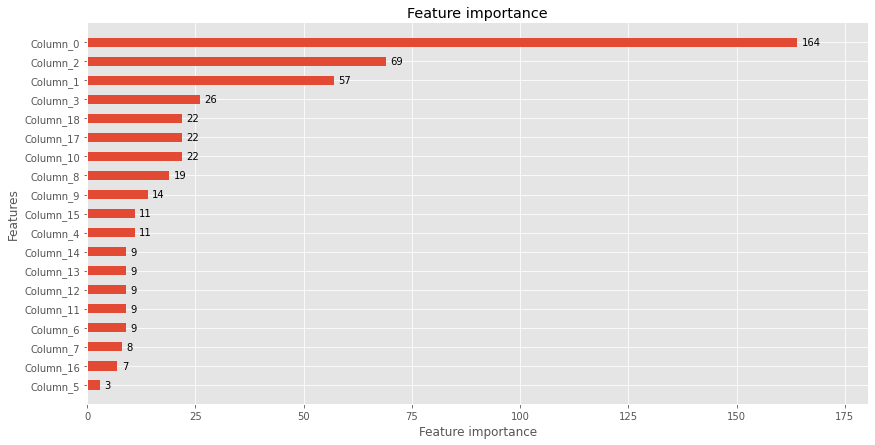

In [79]:
lgb.plot_importance(LGBM_smoTomek, height=.5)

In [50]:
columns= transformer.get_feature_names_out

<bound method ColumnTransformer.get_feature_names_out of ColumnTransformer(remainder='passthrough',
                  transformers=[('transformer_numerico', MinMaxScaler(),
                                 ['age', 'avg_glucose_level', 'bmi',
                                  'hypertension', 'heart_disease']),
                                ('transformer_categorico', OneHotEncoder(),
                                 ['work_type', 'smoking_status', 'gender',
                                  'ever_married', 'Residence_type'])])>

In [51]:
X_plot = pd.DataFrame (X, columns=transformer.get_feature_names_out())


# Y si quitamos la columna `Age`, que es a que da mas feature_importance

In [103]:
df= pd.read_csv('/kaggle/input/ictus-data-set/stroke_dataset.csv')

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder , LabelEncoder
from sklearn.compose import ColumnTransformer

numericas = ["avg_glucose_level" , "bmi" , "hypertension", "heart_disease"]
categoricas= ["work_type" , "smoking_status" , "gender", "ever_married" , "Residence_type"]

#Configuro los transformer
transformer_numerico_prueba = ("transformer_numerico",MinMaxScaler(), numericas) 
transformer_categorico_prueba = ("transformer_categorico",OneHotEncoder(), categoricas)

#Defino el transformer
transformer_prueba = ColumnTransformer ([transformer_numerico_prueba, transformer_categorico_prueba ], remainder="passthrough")

In [104]:
X_new = df.drop(columns=['stroke', 'age'],axis=1)
y= df['stroke']

In [105]:
X_p = transformer_prueba.fit_transform(X_new) 
pd.DataFrame(X_p, columns= transformer_prueba.get_feature_names_out())

,transformer_numerico__avg_glucose_level,transformer_numerico__bmi,transformer_numerico__hypertension,transformer_numerico__heart_disease,transformer_categorico__work_type_Govt_job,transformer_categorico__work_type_Private,transformer_categorico__work_type_Self-employed,transformer_categorico__work_type_children,transformer_categorico__smoking_status_Unknown,transformer_categorico__smoking_status_formerly smoked,transformer_categorico__smoking_status_never smoked,transformer_categorico__smoking_status_smokes,transformer_categorico__gender_Female,transformer_categorico__gender_Male,transformer_categorico__ever_married_No,transformer_categorico__ever_married_Yes,transformer_categorico__Residence_type_Rural,transformer_categorico__Residence_type_Urban
0,0.801265,0.647564,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
1,0.234512,0.530086,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
2,0.536008,0.584527,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
3,0.549349,0.286533,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
4,0.605161,0.429799,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,0.069384,0.452722,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
4977,0.627966,0.489971,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4978,0.184194,0.510029,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0
4979,0.133044,0.458453,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0


In [107]:
from sklearn.model_selection import train_test_split
X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(X_p, y, test_size=0.20, random_state=101, stratify=y)

In [109]:
from imblearn.combine import SMOTETomek

os_us = SMOTETomek()

X_train_st_p, y_train_st_p = os_us.fit_resample(X_train_p,y_train_p)  

In [113]:
LGBM_smoTomek_p = LGBMClassifier(colsample_bytree=1, learning_rate=1, max_bin=510,
                 n_estimators=500, num_leaves=2, objective='binary', reg_alpha=1,
                 reg_lambda=2, subsample=1 , boosting_type= ['gbdt'] , scale_pos_weight = [191])

LGBM_smoTomek_p.fit(X = X_train_st_p, y = y_train_st_p)

LGBMClassifier(boosting_type=['gbdt'], colsample_bytree=1, learning_rate=1,
               max_bin=510, n_estimators=500, num_leaves=2, objective='binary',
               reg_alpha=1, reg_lambda=2, scale_pos_weight=[191], subsample=1)

-----------------------------------------------------
Balanced_accuracy de test es: 57.71 %

Overfitting balanced -2.35 % 
-----------------------------------------------------
F1_score: 57.71 %
-----------------------------------------------------
recall: 100.00 %
-----------------------------------------------------
Accuracy_test es: 19.66 %

Accuracy_train es: 59.06 %

Overfitting -200.45 % 
-----------------------------------------------------

-----------------------------------------------------



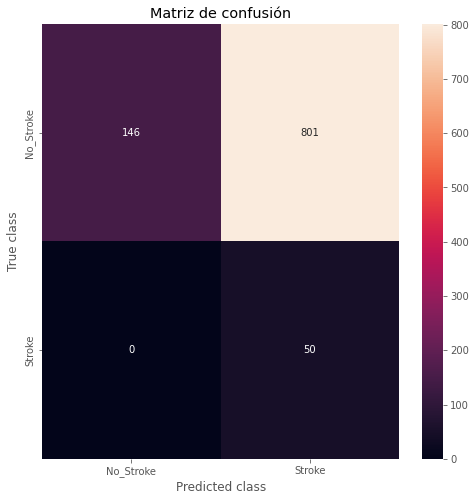


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.15      0.27       947
           1       0.06      1.00      0.11        50

    accuracy                           0.20       997
   macro avg       0.53      0.58      0.19       997
weighted avg       0.95      0.20      0.26       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.18      0.31      3646
           1       0.55      1.00      0.71      3646

    accuracy                           0.59      7292
   macro avg       0.77      0.59      0.51      7292
weighted avg       0.77      0.59      0.51      7292




In [115]:
# Prediccion y evaluacion del modelo
y_pred_bbc= LGBM_smoTomek_p.predict(X_test_p)
y_pred_train_bbc= LGBM_smoTomek_p.predict(X_train_st_p)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test_p, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_st_p,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_st_p, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test_p, y_pred_bbc)
#recall
recall= recall_score(y_test_p , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
#print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_rus))
print("")
#print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_rus) *100))
print("-----------------------------------------------------")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test_p, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test_p, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test_p, y_pred_bbc))
    
mostrar_resultados(y_test_p, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_st_p,y_pred_train_bbc))
print("")

In [121]:
X_plot_p = pd.DataFrame (X_new, columns=transformer_prueba.get_feature_names_out())


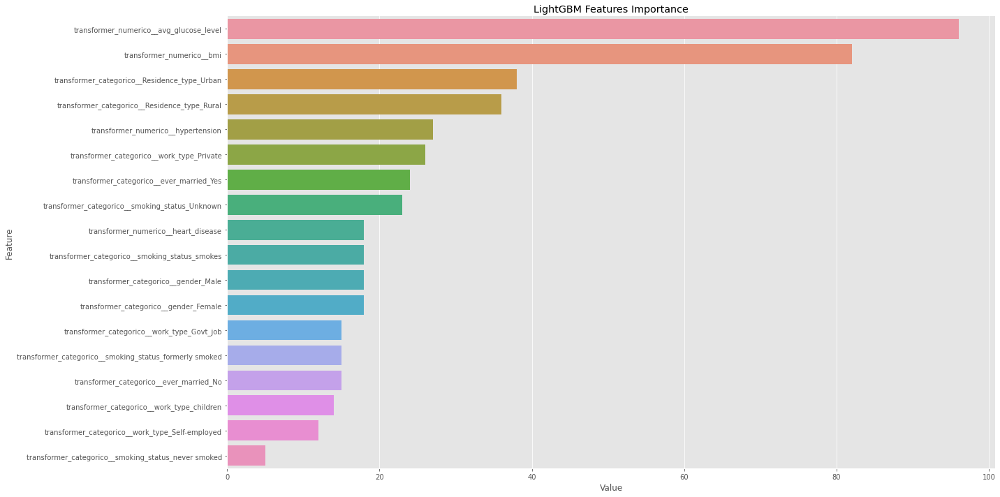

<Figure size 1008x504 with 0 Axes>

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp_na = pd.DataFrame(sorted(zip(LGBM_smoTomek_p.feature_importances_,X_plot_p.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp_na.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features Importance')
plt.tight_layout()
plt.show()
plt.savefig('lgbm_importances-01.png')

In [124]:
feature_imp_na.sort_values(by="Value", ascending=False)

,Value,Feature
17,96,transformer_numerico__avg_glucose_level
16,82,transformer_numerico__bmi
15,38,transformer_categorico__Residence_type_Urban
14,36,transformer_categorico__Residence_type_Rural
13,27,transformer_numerico__hypertension
12,26,transformer_categorico__work_type_Private
11,24,transformer_categorico__ever_married_Yes
10,23,transformer_categorico__smoking_status_Unknown
9,18,transformer_numerico__heart_disease
8,18,transformer_categorico__smoking_status_smokes


-----------------------------------------------------
Balanced_accuracy de test es: 57.71 %

Overfitting balanced -2.35 % 
-----------------------------------------------------
F1_score: 57.71 %
-----------------------------------------------------
recall: 100.00 %
-----------------------------------------------------
Accuracy_test es: 19.66 %

Accuracy_train es: 59.06 %

Overfitting -200.45 % 
-----------------------------------------------------

-----------------------------------------------------



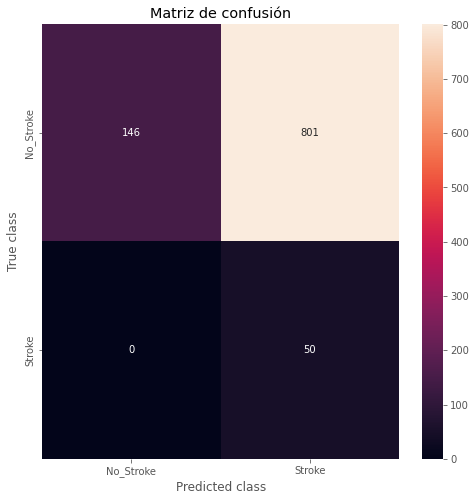


Reporte de Clasificación (test)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.15      0.27       947
           1       0.06      1.00      0.11        50

    accuracy                           0.20       997
   macro avg       0.53      0.58      0.19       997
weighted avg       0.95      0.20      0.26       997


Reporte de Clasificación (train)
-------------------
              precision    recall  f1-score   support

           0       1.00      0.18      0.31      3646
           1       0.55      1.00      0.71      3646

    accuracy                           0.59      7292
   macro avg       0.77      0.59      0.51      7292
weighted avg       0.77      0.59      0.51      7292




In [125]:
# Prediccion y evaluacion del modelo
y_pred_bbc= LGBM_smoTomek_p.predict(X_test_p)
y_pred_train_bbc= LGBM_smoTomek_p.predict(X_train_st_p)

#Accuracy del modelo
accuracy_test_predict_bbc= accuracy_score(y_test_p, y_pred_bbc)
#Accuracy del train
accuracy_train_bbc = accuracy_score(y_train_st_p,y_pred_train_bbc)

#balanced_Accuracy del modelo
balanced_accuracy_test= balanced_accuracy_score(y_test_p, y_pred_bbc)
balanced_accuracy_train= balanced_accuracy_score(y_train_st_p, y_pred_train_bbc)

#f1_score
f1_score = balanced_accuracy_score(y_test_p, y_pred_bbc)
#recall
recall= recall_score(y_test_p , y_pred_bbc)

print("-----------------------------------------------------")
print("Balanced_accuracy de test es: {:.2f} %".format(100 * balanced_accuracy_test))
print("")
print("Overfitting balanced {:.2f} % ".format(((balanced_accuracy_test - balanced_accuracy_train)/balanced_accuracy_test) *100))
print("-----------------------------------------------------")
print("F1_score: {:.2f} %".format(100 * f1_score))
print("-----------------------------------------------------")
print("recall: {:.2f} %".format(100 * recall))
print("-----------------------------------------------------")
print("Accuracy_test es: {:.2f} %".format(100 * accuracy_test_predict_bbc))
print("")
print("Accuracy_train es: {:.2f} %".format(100 * accuracy_train_bbc))
print("")
print("Overfitting {:.2f} % ".format(((accuracy_test_predict_bbc - accuracy_train_bbc)/accuracy_test_predict_bbc) *100))
print("-----------------------------------------------------")
#print("Accuracy del cross_validate es: {:.2f} %".format(100 * cv_accuracy_rus))
print("")
#print("El overfitting del cross_validate (test) y train es {:.2f} % ".format((cv_overfitting_rus) *100))
print("-----------------------------------------------------")
print("")

Labels= 'No_Stroke', 'Stroke'

def mostrar_resultados(y_test, y_pred__bbc):
    conf_matrix = confusion_matrix(y_test_p, y_pred_bbc)
    plt.figure(figsize=(8, 8))
    sns.heatmap(conf_matrix, xticklabels=Labels, yticklabels=Labels, annot=True, fmt="d");
    plt.title("Matriz de confusión")
    plt.ylabel('True class')
    plt.xlabel('Predicted class')
    plt.show()
    print("")
    print("Reporte de Clasificación (test)")
    print("-------------------")
    print (classification_report(y_test_p, y_pred_bbc))
    
mostrar_resultados(y_test_p, y_pred_bbc)
print("")
print("Reporte de Clasificación (train)")
print("-------------------")
print (classification_report(y_train_st_p,y_pred_train_bbc))
print("")